# Housing Price Prediction with Geospatial Analysis
Raphael E. Gutierrez • September 20, 2021

## Preliminaries

In [2]:
# starters
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# packages for fetching & files
import os
import tarfile
from six.moves import urllib

# packages for geospatial plotting & analysis
import geopandas as gpd
import folium

### Helper Functions for fetching and loading data

In [3]:
def fetch_dataset(url, path):
    if not os.path.isdir(path):  # creates path or folder if path isn't found
        os.makedirs(path)
        
    data_path = os.path.join(path, "housing.tgz")  # joins paths
    
    urllib.request.urlretrieve(url, data_path)  # retrieves dataset and saves to path
    
    dataset = tarfile.open(data_path)  # opens tgz file, extracts, and closes
    dataset.extractall(path=path)
    dataset.close()
    
    
def load_dataset(path):
    data_path = os.path.join(path, "housing.csv")  # loads data using path
    return pd.read_csv(data_path)

In [4]:
url = "https://raw.githubusercontent.com/ageron/handson-ml2/master/datasets/housing/housing.tgz"
path = os.path.join("dataset", "housing")

fetch_dataset(url, path)

In [5]:
df = load_dataset(path)

df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


## Data Analysis
Using df.info(), we know that total_bedrooms has 207 missing values. All attributes are numerical, except ocean_proximity.

In [6]:
df.shape

(20640, 10)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


### Standard Correlation Coefficient (Pearson's r)

<AxesSubplot:>

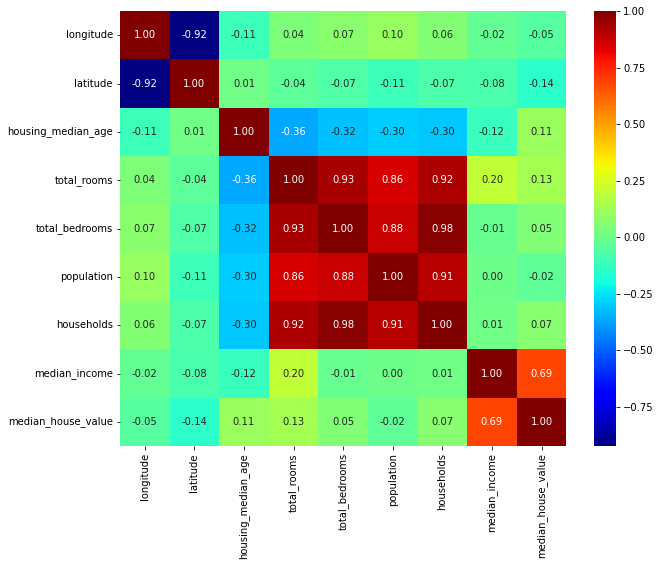

In [8]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, fmt=".2f", cmap=plt.get_cmap("jet"))

Side note on describe(): The std row shows the standard deviation, which measures how dispersed the values are.
The 25%, 50%, and 75% rows show the corresponding percentiles: a percentile indicates the value below which a given percentage of observations in a group of observations falls. For example, 25% of the districts have a housing_median_age lower than 18, while 50% are lower than 29 and 75% are lower than 37. These are often called the 25th percentile (or 1st quartile), the median, and the 75th percentile (or 3rd quartile).

In [9]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


The capping of values can be seen on most of the plots. What we are concerned about is the median_house_value x median_income plot as it shows a linear relation. Observation on the plot: The max value is capped at 500,000 median_house_value. This can be a possible outlier

array([[<AxesSubplot:xlabel='median_house_value', ylabel='median_house_value'>,
        <AxesSubplot:xlabel='median_income', ylabel='median_house_value'>,
        <AxesSubplot:xlabel='total_rooms', ylabel='median_house_value'>,
        <AxesSubplot:xlabel='housing_median_age', ylabel='median_house_value'>],
       [<AxesSubplot:xlabel='median_house_value', ylabel='median_income'>,
        <AxesSubplot:xlabel='median_income', ylabel='median_income'>,
        <AxesSubplot:xlabel='total_rooms', ylabel='median_income'>,
        <AxesSubplot:xlabel='housing_median_age', ylabel='median_income'>],
       [<AxesSubplot:xlabel='median_house_value', ylabel='total_rooms'>,
        <AxesSubplot:xlabel='median_income', ylabel='total_rooms'>,
        <AxesSubplot:xlabel='total_rooms', ylabel='total_rooms'>,
        <AxesSubplot:xlabel='housing_median_age', ylabel='total_rooms'>],
       [<AxesSubplot:xlabel='median_house_value', ylabel='housing_median_age'>,
        <AxesSubplot:xlabel='median_incom

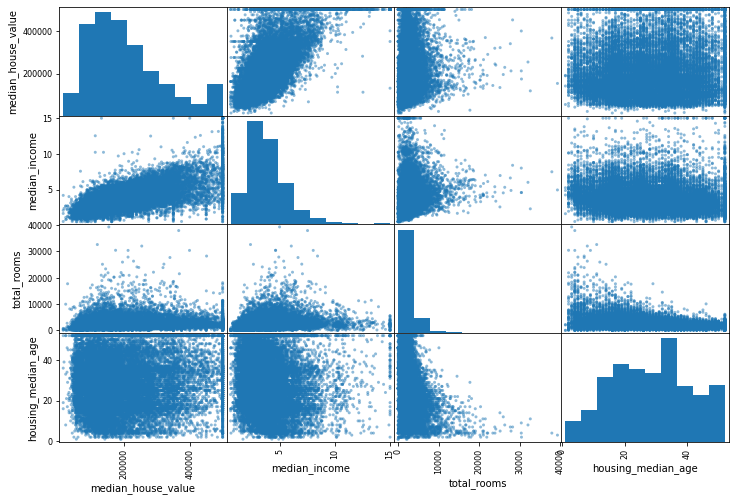

In [10]:
attributes = ["median_house_value", "median_income", "total_rooms", "housing_median_age"]

pd.plotting.scatter_matrix(df[attributes], figsize=(12,8))

In [11]:
df["ocean_proximity"].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

### Distribution Analysis
Observations:

1. median_income is not expressed in dollars (x10,000 USD). Also, the feature is capped at 0.5 and 15

2. housing_median_age andmedian_house_value are also capped at 50 and 500,000 respectively

3. Features are in different scales

4. Hist plots are tail-heavy. Need to be bell-curved.

array([[<AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'housing_median_age'}>],
       [<AxesSubplot:title={'center':'total_rooms'}>,
        <AxesSubplot:title={'center':'total_bedrooms'}>,
        <AxesSubplot:title={'center':'population'}>],
       [<AxesSubplot:title={'center':'households'}>,
        <AxesSubplot:title={'center':'median_income'}>,
        <AxesSubplot:title={'center':'median_house_value'}>]],
      dtype=object)

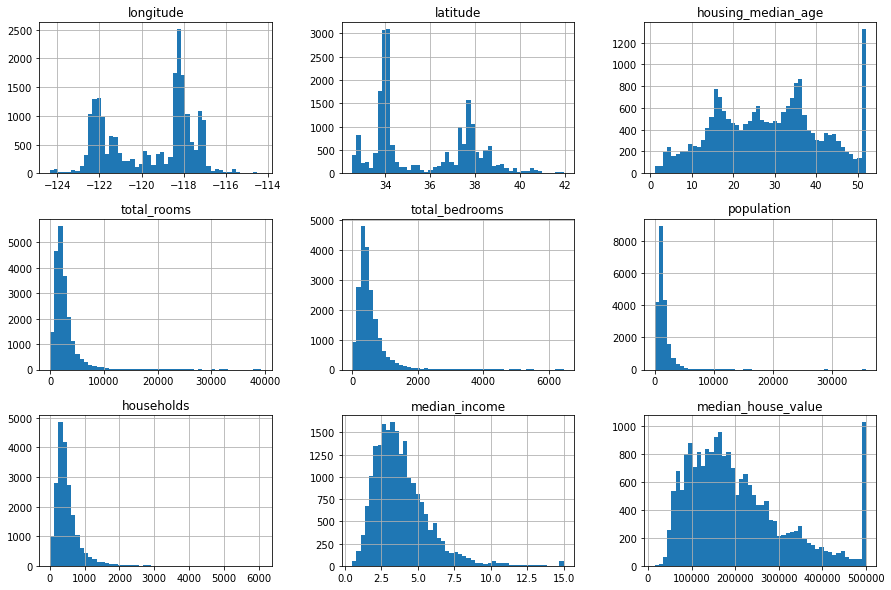

In [12]:
df.hist(bins=50, figsize=(15,10))

Side note on next cell: Hist plot in grouped data to 5 category ranges

<AxesSubplot:>

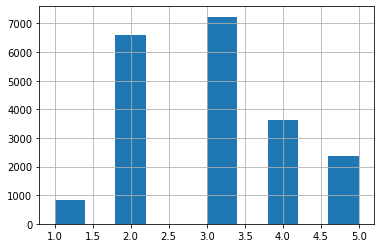

In [13]:
pd.cut(df["median_income"], bins=[0, 1.5, 3, 4.5, 6, np.inf], labels=[1,2,3,4,5]).hist()

## Geospatial Analysis
Looking at the plots below, we can say that the highest median house values are located at the coastline, possibly near the beaches of California. There are also clusters of densed houses. In the folium interactive plot, two of the highest populated areas are also located at the coastline (wide blue circles).

Setting set alpha value from 0.1 to 0.5 helps visualize dense areas.

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

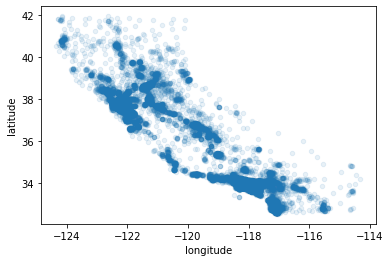

In [14]:
df.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1)

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

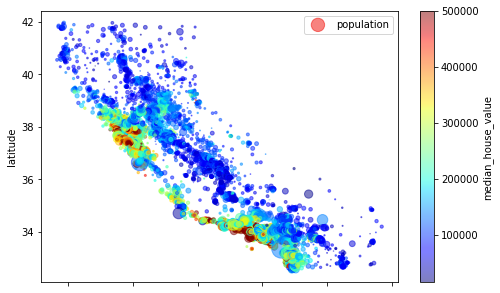

In [15]:
df.plot(kind="scatter", x="longitude", y="latitude", s=df["population"]/100, alpha=0.5, 
        c="median_house_value", cmap=plt.get_cmap("jet"), label="population", figsize=(8,5))

# s - size of circle
# c - color/type/differs in

Side notes on EPSG & CRS: 
- 4326 - latitude/longitude coordinate system based on the Earth's center of mass, used by GPS
- 3857 - Web Mercator projection used for display by many web-based mapping tools


/opt/conda/lib/python3.7/site-packages/pyproj/crs/crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<AxesSubplot:>

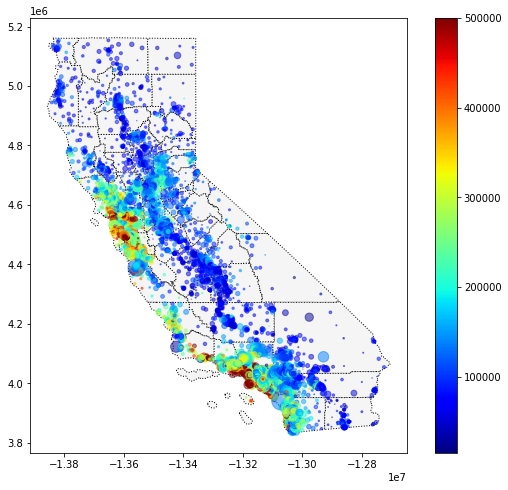

In [16]:
df_geo = gpd.GeoDataFrame(df.copy(), geometry=gpd.points_from_xy(df["longitude"], df["latitude"]))
df_geo.crs = {"init": "epsg:4326"}

regions = gpd.read_file("../input/cashapefiles/CA_Counties_TIGER2016.shp")

ax = regions.plot(figsize=(10,8), color="whitesmoke", linestyle=":", edgecolor="black")

df_geo.to_crs(epsg=3857).plot(column="median_house_value", markersize=df["population"]/100,
                              alpha=0.5, ax=ax, c="median_house_value", 
                              cmap=plt.get_cmap("jet"), legend=True)


# markersize - s
# because population has big numbers, we divide it by 100 per value

In [17]:
import branca
import branca.colormap as cm

colormap = cm.LinearColormap(["green", "blue", "yellow", "red"], 
                             index=np.linspace(df.median_house_value.min(), df.median_house_value.max(), 4),
                             vmin=df.median_house_value.min(), vmax=df.median_house_value.max())

# index - 4 points where colors span
# we use linspace of min and max to get 4 equally spaced values
# vmin & vmax specifies min & max

map_obj = folium.Map(prefer_canvas=True, width=500, height=500, location=[df.latitude[0], df.longitude[0]], zoom_start=6)

for row in range(df.shape[0]):
    folium.CircleMarker(location=[df.loc[row, "latitude"], df.loc[row, "longitude"]],
                        radius=df.loc[row,"population"]/1000, fill=True,
                        color=colormap(df.loc[row, "median_house_value"]),
                        fill_opacity=0.5, weight=1).add_to(map_obj)

    
map_obj.add_child(colormap)
map_obj

## Splitting the Data
Using functions made from scratch

In [18]:
def split_train_test(data, test_ratio):
    np.random.seed(42)
    shuffled_indices = np.random.permutation(len(data))  # shuffles indices of dataset
    
    test_set_size = int(len(data) * test_ratio)  # computes test set size using ratio
    
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    
    return data.iloc[train_indices], data.iloc[test_indices]

In [19]:
train, test = split_train_test(df, 0.2)

print("Train size:", train.shape)
print("Test size:", test.shape)

Train size: (16512, 10)
Test size: (4128, 10)


In [20]:
X_train = train.drop("median_house_value", axis=1)
y_train = train["median_house_value"]

X_test = test.drop("median_house_value", axis=1)
y_test = test["median_house_value"]

## Feature Engineering

### SimpleImputer to impute missing data
Recommended way. This is to use its fit and transform methods to also transform the test set

In [21]:
from sklearn.impute import SimpleImputer

X_train_num = X_train.drop("ocean_proximity", axis=1)
X_test_num = X_test.drop("ocean_proximity", axis=1)

imputer = SimpleImputer(strategy="median")
imputer.fit(X_train_num)

imputer.statistics_

array([-118.51  ,   34.26  ,   29.    , 2129.    ,  437.    , 1167.    ,
        410.    ,    3.5458])

In [22]:
X_train_imputed = imputer.transform(X_train_num)
X_test_imputed = imputer.transform(X_test_num)

X_train_imputed

array([[-1.1703e+02,  3.2710e+01,  3.3000e+01, ...,  2.3000e+03,
         6.2300e+02,  3.2596e+00],
       [-1.1816e+02,  3.3770e+01,  4.9000e+01, ...,  1.3140e+03,
         7.5600e+02,  3.8125e+00],
       [-1.2048e+02,  3.4660e+01,  4.0000e+00, ...,  9.1500e+02,
         3.3600e+02,  4.1563e+00],
       ...,
       [-1.1838e+02,  3.4030e+01,  3.6000e+01, ...,  1.7560e+03,
         5.2700e+02,  2.9344e+00],
       [-1.2196e+02,  3.7580e+01,  1.5000e+01, ...,  1.7770e+03,
         5.5900e+02,  5.7192e+00],
       [-1.2242e+02,  3.7770e+01,  5.2000e+01, ...,  2.6190e+03,
         1.2420e+03,  2.5755e+00]])

In [23]:
# gets back to dataframe
X_train_imputed_df = pd.DataFrame(X_train_imputed, columns=X_train_num.columns)
X_test_imputed_df = pd.DataFrame(X_test_imputed, columns=X_test_num.columns)

X_train_imputed_df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
dtype: int64

### StandardScaler to scale the data
Standardization (StandardScaler) is much less affected by outliers (For example, suppose a district had a median income equal to 100 (by mistake). Min-max scaling would then crush all the other values from 0–15 down to 0–0.15, whereas standardization would not be much affected)

In [24]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train_imputed_df)

X_train_scaled = scaler.transform(X_train_imputed_df)
X_test_scaled = scaler.transform(X_test_imputed_df)

X_train_scaled

array([[ 1.27258656, -1.3728112 ,  0.34849025, ...,  0.76827628,
         0.32290591, -0.326196  ],
       [ 0.70916212, -0.87669601,  1.61811813, ..., -0.09890135,
         0.6720272 , -0.03584338],
       [-0.44760309, -0.46014647, -1.95271028, ..., -0.44981806,
        -0.43046109,  0.14470145],
       ...,
       [ 0.59946887, -0.75500738,  0.58654547, ...,  0.28983345,
         0.07090859, -0.49697313],
       [-1.18553953,  0.90651045, -1.07984112, ...,  0.30830275,
         0.15490769,  0.96545045],
       [-1.41489815,  0.99543676,  1.85617335, ...,  1.04883375,
         1.94776365, -0.68544764]])

In [25]:
# gets back to dataframe
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_num.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test_num.columns)

X_train_scaled_df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
0,1.272587,-1.372811,0.348490,0.222569,0.211228,0.768276,0.322906,-0.326196
1,0.709162,-0.876696,1.618118,0.340293,0.593094,-0.098901,0.672027,-0.035843
2,-0.447603,-0.460146,-1.952710,-0.342597,-0.495226,-0.449818,-0.430461,0.144701
3,1.232698,-1.382172,0.586545,-0.561490,-0.409306,-0.007434,-0.380587,-1.017864
4,-0.108551,0.532084,1.142008,-0.119565,-0.256559,-0.485877,-0.314962,-0.171488


### OneHotEncoder to encode categorical (nominal) features
One hot is for nominal, ordinal encoder is for ordinal (with ordering)

In [26]:
from sklearn.preprocessing import OneHotEncoder

X_train_cat = X_train[["ocean_proximity"]]
X_test_cat = X_test[["ocean_proximity"]]

encoder = OneHotEncoder(sparse=False)
encoder.fit(X_train_cat)

encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

In [27]:
X_train_encoded = encoder.transform(X_train_cat)
X_test_encoded = encoder.transform(X_test_cat)

X_train_encoded

array([[0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       ...,
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.]])

In [28]:
# gets back to dataframe
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=encoder.get_feature_names())
X_test_encoded_df = pd.DataFrame(X_test_encoded, columns=encoder.get_feature_names())

X_train_encoded_df.head()

,x0_<1H OCEAN,x0_INLAND,x0_ISLAND,x0_NEAR BAY,x0_NEAR OCEAN
0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,1.0
4,0.0,1.0,0.0,0.0,0.0


### Merge all data

In [29]:
# resets all index so they can concatenate
X_train_scaled_df.reset_index(drop=True, inplace=True)
X_train_encoded_df.reset_index(drop=True, inplace=True)

X_test_scaled_df.reset_index(drop=True, inplace=True)
X_test_encoded_df.reset_index(drop=True, inplace=True)

# merge the df
X_train_merged = pd.concat([X_train_scaled_df, X_train_encoded_df], axis=1)
X_test_merged = pd.concat([X_test_scaled_df, X_test_encoded_df], axis=1)

In [30]:
X_train_merged.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,x0_<1H OCEAN,x0_INLAND,x0_ISLAND,x0_NEAR BAY,x0_NEAR OCEAN
0,1.272587,-1.372811,0.348490,0.222569,0.211228,0.768276,0.322906,-0.326196,0.0,0.0,0.0,0.0,1.0
1,0.709162,-0.876696,1.618118,0.340293,0.593094,-0.098901,0.672027,-0.035843,0.0,0.0,0.0,0.0,1.0
2,-0.447603,-0.460146,-1.952710,-0.342597,-0.495226,-0.449818,-0.430461,0.144701,0.0,0.0,0.0,0.0,1.0
3,1.232698,-1.382172,0.586545,-0.561490,-0.409306,-0.007434,-0.380587,-1.017864,0.0,0.0,0.0,0.0,1.0
4,-0.108551,0.532084,1.142008,-0.119565,-0.256559,-0.485877,-0.314962,-0.171488,0.0,1.0,0.0,0.0,0.0


## Cross-Validation
Side note: If the score on the training set is much lower than on the validation sets, meaning the model is overfitting the training set

In [31]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression

lr_scores = cross_val_score(LinearRegression(), X_train_merged, y_train, cv=5, scoring="neg_mean_squared_error")
print("RMSE Mean: %.2f" % np.sqrt(-lr_scores).mean())
print("Std: %.2f" % np.sqrt(-lr_scores).std())

RMSE Mean: 68622.54
Std: 1438.77


In [32]:
from sklearn.tree import DecisionTreeRegressor

dt_scores = cross_val_score(DecisionTreeRegressor(), X_train_merged, y_train, cv=5, scoring="neg_mean_squared_error")
print("RMSE Mean: %.2f" % np.sqrt(-dt_scores).mean())
print("Std: %.2f" % np.sqrt(-dt_scores).std())

RMSE Mean: 69646.55
Std: 1340.80


In [33]:
from sklearn.ensemble import RandomForestRegressor

rf_scores = cross_val_score(RandomForestRegressor(), X_train_merged, y_train, cv=5, scoring="neg_mean_squared_error")
print("RMSE Mean: %.2f" % np.sqrt(-rf_scores).mean())
print("Std: %.2f" % np.sqrt(-rf_scores).std())

RMSE Mean: 49226.76
Std: 688.55


## Hyperparameter Tuning using RandomizedSearchCV
RandomForestRegressor is used because it has the lowet RMSE/error and std (how disperse the values are)

In [34]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {"n_estimators": [5, 10, 20], "max_features": [2, 5, 8]}

rs = RandomizedSearchCV(RandomForestRegressor(), param_grid, n_iter=10, cv=5,
                        scoring="neg_mean_squared_error", n_jobs=-1)
rs.fit(X_train_merged, y_train)

# 3x3=9 on param_grid, x5 cv = 45 combinations in 10 iterations

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_search.py:282: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_features': [2, 5, 8],
                                        'n_estimators': [5, 10, 20]},
                   scoring='neg_mean_squared_error')

In [35]:
print("Best validation score (RMSE):", np.sqrt(-rs.best_score_))
print("Best parameters:", rs.best_params_)
print("Best estimator:", rs.best_estimator_)

Best validation score (RMSE): 50003.543248847825
Best parameters: {'n_estimators': 20, 'max_features': 8}
Best estimator: RandomForestRegressor(max_features=8, n_estimators=20)


## Feature Importance
Shows how important a feature in finding the good model. The median income has the only high importance value so the median income is the number one predictor of housing prices.

In [37]:
sorted(zip(rs.best_estimator_.feature_importances_, X_train_merged.columns))

[(0.0003782186956009717, 'x0_ISLAND'),
 (0.0026832420932582307, 'x0_NEAR BAY'),
 (0.007221482898410387, 'x0_NEAR OCEAN'),
 (0.00735591565239542, 'x0_<1H OCEAN'),
 (0.02475061645975059, 'households'),
 (0.028897536295954852, 'total_bedrooms'),
 (0.031042629660424998, 'total_rooms'),
 (0.04054590395188099, 'population'),
 (0.052062970492562255, 'housing_median_age'),
 (0.09971186143701362, 'latitude'),
 (0.10361341372414098, 'longitude'),
 (0.13851434356971865, 'x0_INLAND'),
 (0.46322186506888796, 'median_income')]

## Fitting, Prediction, Confidence Interval

In [38]:
model = RandomForestRegressor(**rs.best_params_)
model.fit(X_train_merged, y_train)

RandomForestRegressor(max_features=8, n_estimators=20)

In [39]:
from sklearn.metrics import mean_squared_error

y_pred = model.predict(X_test_merged)
np.sqrt(mean_squared_error(y_test, y_pred))

50843.714225031705

In [40]:
from scipy import stats

squared_errors = (y_pred - y_test) ** 2

np.sqrt(stats.t.interval(0.95, len(squared_errors) - 1, loc=squared_errors.mean(),
                         scale=stats.sem(squared_errors)))

array([48491.69347876, 53091.63979343])

Interpretation: There's only 5% chance that the true population mean (or the predicted median house value) is less than 48491.69 or greater than 53091.64